In [3]:
import os
import random
import librosa
import librosa.display
import pandas as pd
import numpy as np
import IPython.display as ipd
import matplotlib.pyplot as plt

In [4]:
categories = [
  'ambulance', 'fire-and-trucks', 'police'
]

In [5]:
def select_random_audio(category):
  directory = 'datasets/final_audio/'
  files = os.listdir(directory)
  
  category_files = [file for file in files if file.startswith(category)]

  if not category_files:
    print(f"No files with category {category}")
    return None

  selected_file = random.choice(category_files)
  return os.path.join(directory, selected_file)

In [6]:
audio_ambulance = select_random_audio(categories[0])
audio_fire_n_trucks = select_random_audio(categories[1])
audio_police = select_random_audio(categories[2])

signal_1, sr1 = librosa.load(audio_ambulance)
signal_2, sr2 = librosa.load(audio_fire_n_trucks)
signal_3, sr3 = librosa.load(audio_police)

In [67]:
ipd.Audio(audio_ambulance)

In [68]:
ipd.Audio(audio_fire_n_trucks)

In [69]:
ipd.Audio(audio_police)

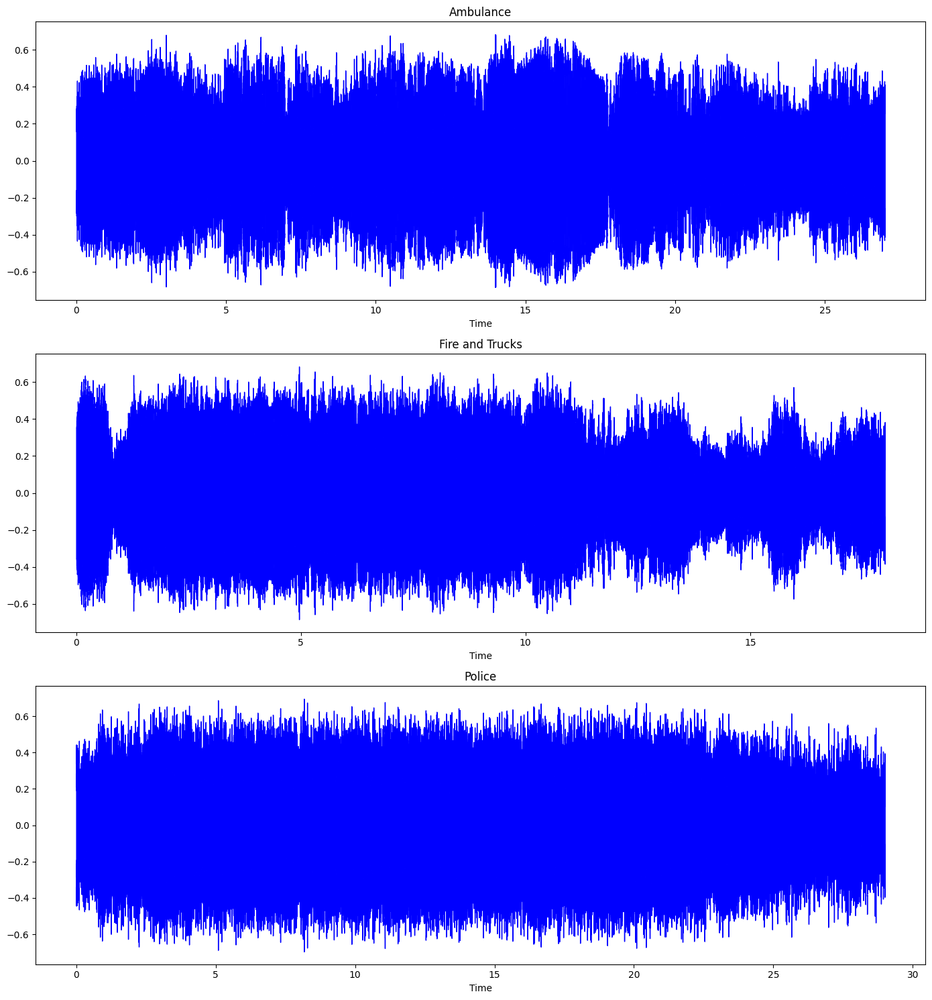

In [5]:
plt.figure(figsize=(14, 15))

plt.subplot(3, 1, 1)
librosa.display.waveshow(signal_1, sr=sr1, color="blue")
plt.title("Ambulance")

plt.subplot(3, 1, 2)
librosa.display.waveshow(signal_2, sr=sr2, color="blue")
plt.title("Fire and Trucks")

plt.subplot(3, 1, 3)
librosa.display.waveshow(signal_3, sr=sr3, color="blue")
plt.title("Police")

plt.tight_layout()
plt.show()

# Sound Envelope

In [7]:
def sound_envelope(signal):
  envelope_arr = []
  # calculate on each frame
  for i in range(0, len(signal), 512):  # hop length = 512
    current_frame = max(signal[i:i+1024]) # frame size=1024
    envelope_arr.append(current_frame)
  return np.array(envelope_arr)

In [15]:
env_signal_1 = sound_envelope(signal_1)
env_signal_2 = sound_envelope(signal_2)
env_signal_3 = sound_envelope(signal_3)

In [16]:
frames_1 = range(len(env_signal_1))
t_1 = librosa.frames_to_time(frames_1, hop_length=512)

frames_2 = range(len(env_signal_2))
t_2 = librosa.frames_to_time(frames_2, hop_length=512)

frames_3 = range(len(env_signal_3))
t_3 = librosa.frames_to_time(frames_3, hop_length=512)

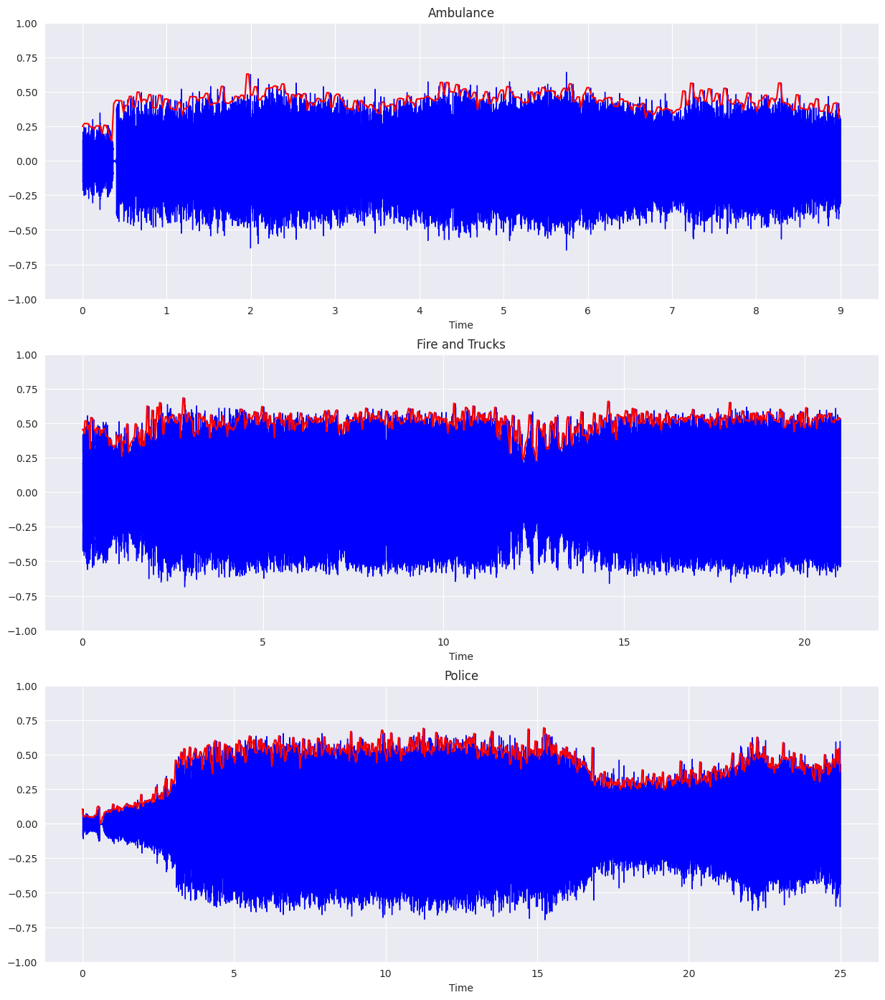

In [26]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(signal_1, sr=sr1, color="blue")
plt.plot(t_1, env_signal_1, color="r")
plt.ylim((-1, 1))
plt.title("Ambulance")

plt.subplot(3, 1, 2)
librosa.display.waveshow(signal_2, sr=sr2, color="blue")
plt.plot(t_2, env_signal_2, color="r")
plt.ylim((-1, 1))
plt.title("Fire and Trucks")

plt.subplot(3, 1, 3)
librosa.display.waveshow(signal_3, sr=sr3, color="blue")
plt.plot(t_3, env_signal_3, color="r")
plt.ylim((-1, 1))
plt.title("Police")

plt.show()

# Root Mean Squared energy

In [22]:
rms_signal_1 = librosa.feature.rms(y=signal_1, frame_length=1024, hop_length=512)[0]
rms_signal_2 = librosa.feature.rms(y=signal_2, frame_length=1024, hop_length=512)[0]
rms_signal_3 = librosa.feature.rms(y=signal_3, frame_length=1024, hop_length=512)[0]

In [23]:
rms_frames_1 = range(len(rms_signal_1))
t_rms_1 = librosa.frames_to_time(rms_frames_1, hop_length=512)

rms_frames_2 = range(len(rms_signal_2))
t_rms_2 = librosa.frames_to_time(rms_frames_2, hop_length=512)

rms_frames_3 = range(len(rms_signal_3))
t_rms_3 = librosa.frames_to_time(rms_frames_3, hop_length=512)

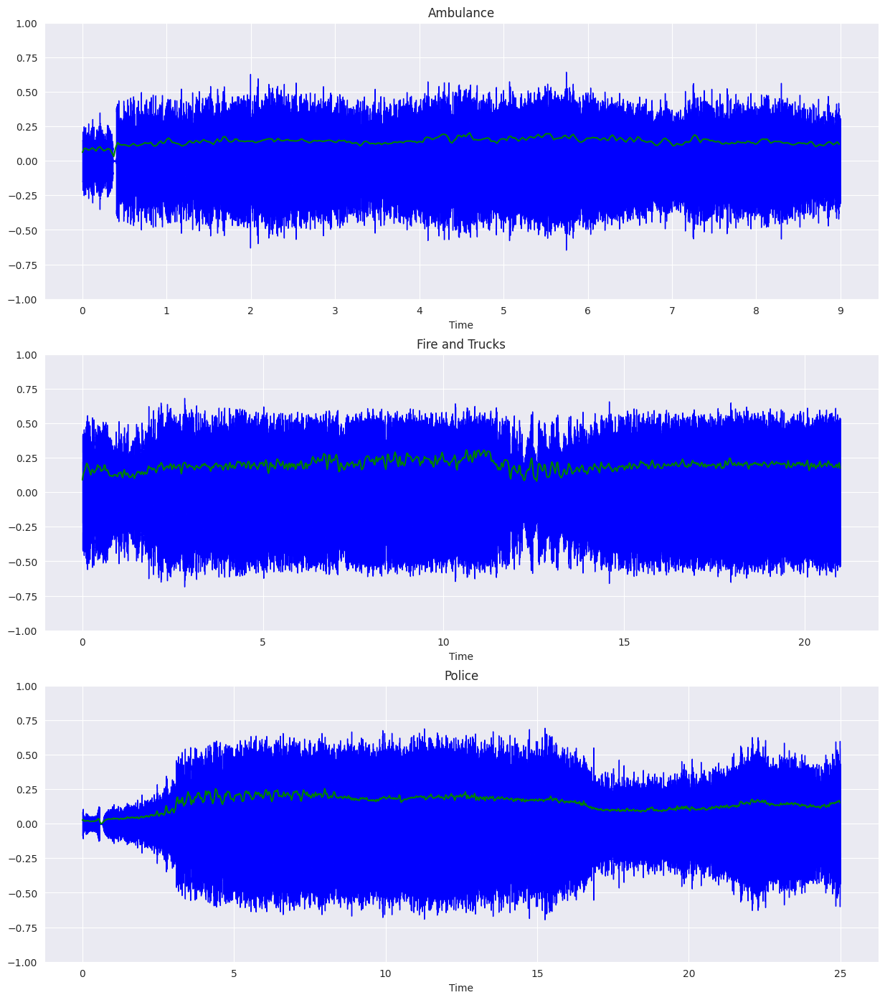

In [27]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(signal_1, sr=sr1, color="blue")
plt.plot(t_rms_1, rms_signal_1, color="g")
plt.ylim((-1, 1))
plt.title("Ambulance")

plt.subplot(3, 1, 2)
librosa.display.waveshow(signal_2, sr=sr2, color="blue")
plt.plot(t_rms_2, rms_signal_2, color="g")
plt.ylim((-1, 1))
plt.title("Fire and Trucks")

plt.subplot(3, 1, 3)
librosa.display.waveshow(signal_3, sr=sr3, color="blue")
plt.plot(t_rms_3, rms_signal_3, color="g")
plt.ylim((-1, 1))
plt.title("Police")

plt.show()

## Mel spectrogram

In [100]:
NUM_FFT = 2048
HOP_LENGTH = 512

In [ ]:
mel_spectrogram_1 = librosa.feature.melspectrogram(y=signal_1, sr=sr1, n_fft=NUM_FFT, hop_length=HOP_LENGTH)
mel_spectrogram_2 = librosa.feature.melspectrogram(y=signal_2, sr=sr2, n_fft=NUM_FFT, hop_length=HOP_LENGTH)
mel_spectrogram_3 = librosa.feature.melspectrogram(y=signal_3, sr=sr3, n_fft=NUM_FFT, hop_length=HOP_LENGTH)

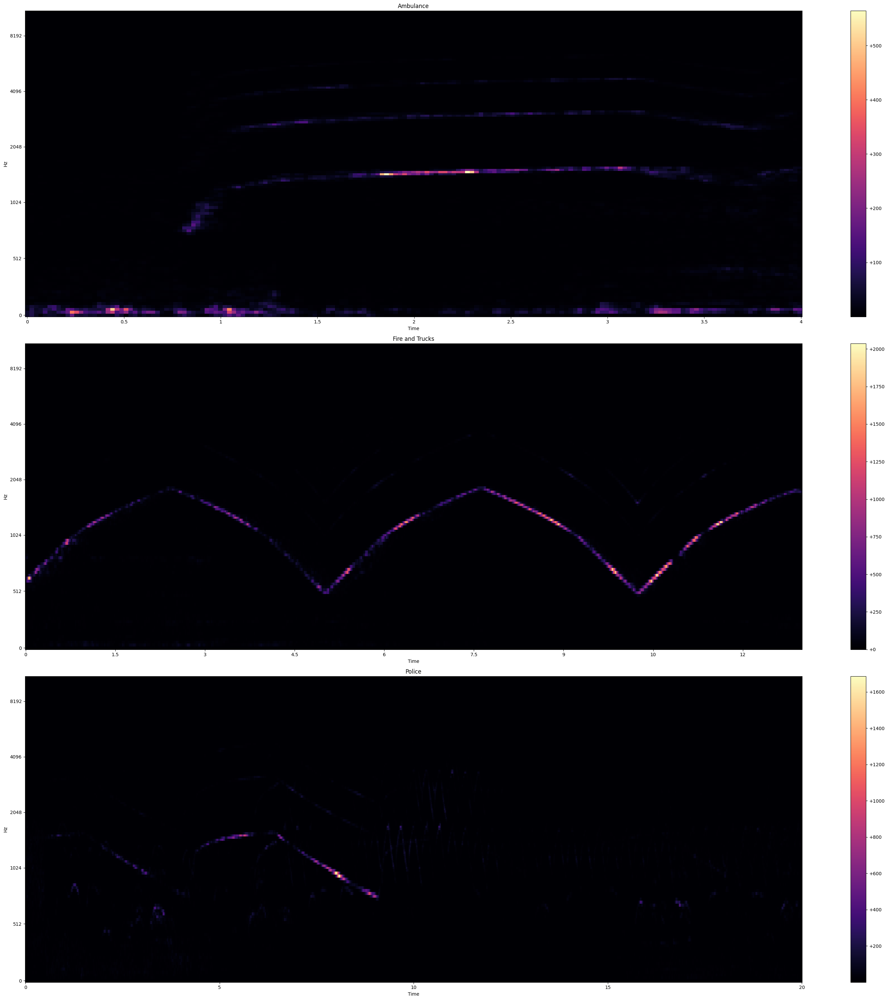

In [134]:
plt.figure(figsize=(30, 30))

plt.subplot(3, 1, 1)
librosa.display.specshow(mel_spectrogram_1, sr=sr1, hop_length=HOP_LENGTH, x_axis="time", y_axis="mel")
plt.title("Ambulance")
plt.colorbar(format="%+2.f")

plt.subplot(3, 1, 2)
librosa.display.specshow(mel_spectrogram_2, sr=sr2, hop_length=HOP_LENGTH, x_axis="time", y_axis="mel")
plt.title("Fire and Trucks")
plt.colorbar(format="%+2.f")

plt.subplot(3, 1, 3)
librosa.display.specshow(mel_spectrogram_3, sr=sr3, hop_length=HOP_LENGTH, x_axis="time", y_axis="mel")
plt.title("Police")
plt.colorbar(format="%+2.f")

plt.tight_layout()
plt.show()
# top mean more energy

In [ ]:
# plt.figure(figsize=(25, 10))
# librosa.display.specshow(Y_1,
#                          sr=sr1, 
#                          hop_length=HOP_LENGTH,
#                          x_axis="time",
#                          y_axis="mel")
# plt.colorbar(format="%+2.f")
# plt.show()

In [135]:
mel_spectrogram_db_1 = librosa.power_to_db(mel_spectrogram_1)
mel_spectrogram_db_2 = librosa.power_to_db(mel_spectrogram_2)
mel_spectrogram_db_3 = librosa.power_to_db(mel_spectrogram_3)

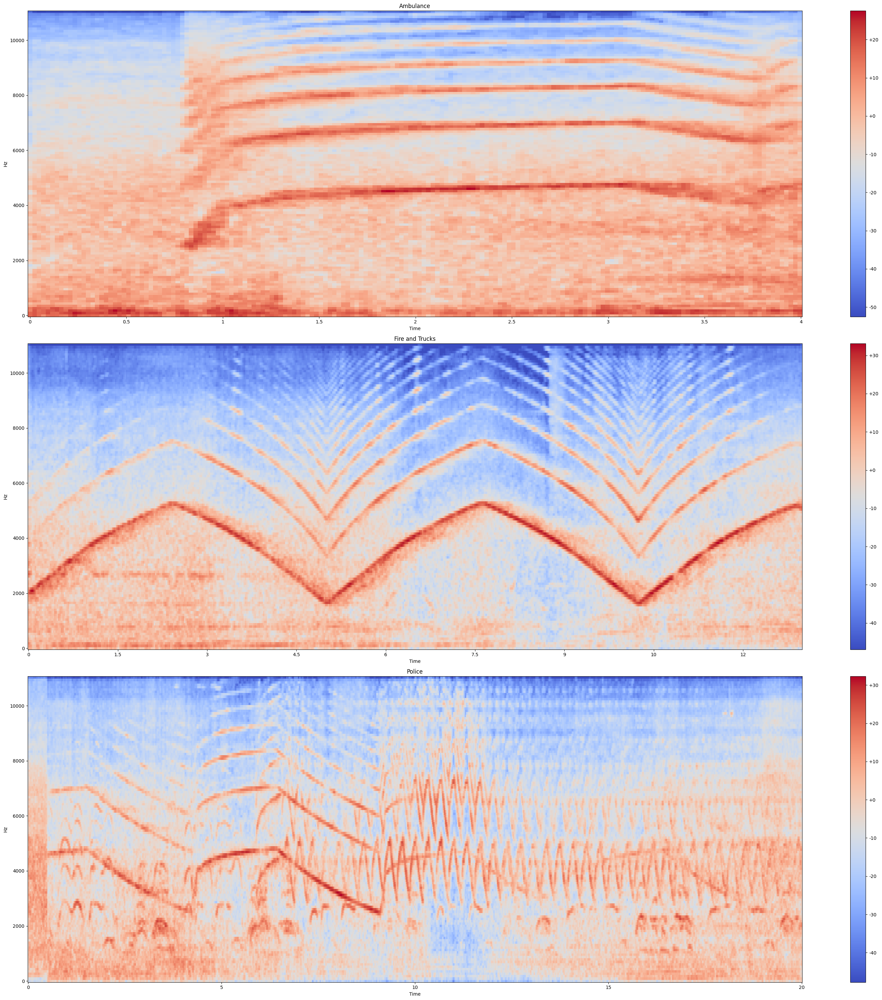

In [136]:
plt.figure(figsize=(30, 30))

plt.subplot(3, 1, 1)
librosa.display.specshow(mel_spectrogram_db_1, sr=sr1, hop_length=HOP_LENGTH, x_axis="time", y_axis="linear")
plt.title("Ambulance")
plt.colorbar(format="%+2.f")

plt.subplot(3, 1, 2)
librosa.display.specshow(mel_spectrogram_db_2, sr=sr2, hop_length=HOP_LENGTH, x_axis="time", y_axis="linear")
plt.title("Fire and Trucks")
plt.colorbar(format="%+2.f")

plt.subplot(3, 1, 3)
librosa.display.specshow(mel_spectrogram_db_3, sr=sr3, hop_length=HOP_LENGTH, x_axis="time", y_axis="linear")
plt.title("Police")
plt.colorbar(format="%+2.f")

plt.tight_layout()
plt.show()

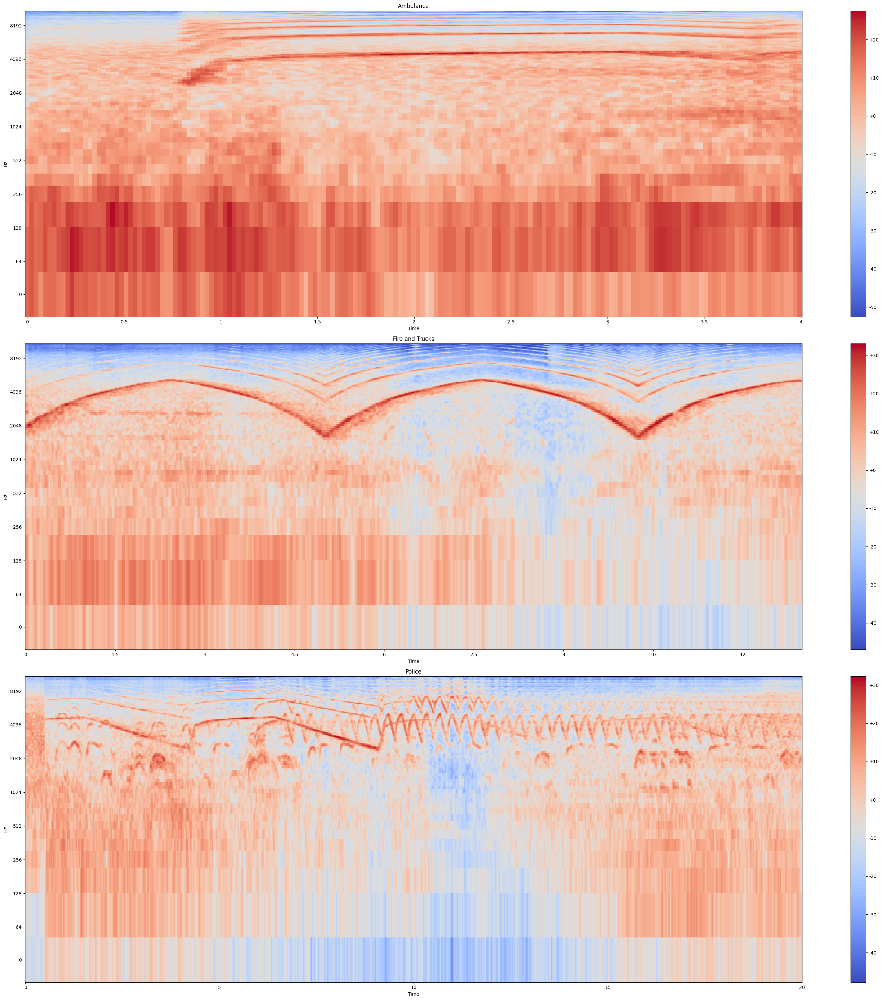

In [137]:
plt.figure(figsize=(30, 30))

plt.subplot(3, 1, 1)
librosa.display.specshow(mel_spectrogram_db_1, sr=sr1, hop_length=HOP_LENGTH, x_axis="time", y_axis="log")
plt.title("Ambulance")
plt.colorbar(format="%+2.f")

plt.subplot(3, 1, 2)
librosa.display.specshow(mel_spectrogram_db_2, sr=sr2, hop_length=HOP_LENGTH, x_axis="time", y_axis="log")
plt.title("Fire and Trucks")
plt.colorbar(format="%+2.f")

plt.subplot(3, 1, 3)
librosa.display.specshow(mel_spectrogram_db_3, sr=sr3, hop_length=HOP_LENGTH, x_axis="time", y_axis="log")
plt.title("Police")
plt.colorbar(format="%+2.f")

plt.tight_layout()
plt.show()

In [139]:
## Short-Time Fourier Transform
stft_1 = librosa.stft(signal_1, n_fft=NUM_FFT, hop_length=HOP_LENGTH)
stft_2 = librosa.stft(signal_2, n_fft=NUM_FFT, hop_length=HOP_LENGTH)
stft_3 = librosa.stft(signal_3, n_fft=NUM_FFT, hop_length=HOP_LENGTH)